In [1]:
import astropy.units as u
from astropy.visualization import quantity_support
quantity_support()
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, LogNorm
from astropy.coordinates import SkyCoord
import astropy.constants as const

import numpy as np
import pandas as pd
import healpy as hp
import gala.dynamics as gd
import gala.units as gu

import kicker

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

# Load data and precompute parameters

In [4]:
%%time
p_bin = kicker.pop.load("data/recent-pop-binaries")
p_sing = kicker.pop.load("data/recent-pop-singles")

CPU times: user 2min 58s, sys: 11.2 s, total: 3min 9s
Wall time: 3min 13s


In [6]:
%%time
p_bin.final_coords
p_sing.final_coords

CPU times: user 6min 33s, sys: 3.53 s, total: 6min 37s
Wall time: 6min 35s


(<SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen_v_sun=(12.9, 245.6, 7.78) km / s, z_sun=20.8 pc, roll=0.0 deg): (x, y, z) in kpc
     [(-4.57522822, -17.4836211 ,  0.08440718),
      (-1.36255731,  -4.20840076,  0.0130997 ),
      (-0.28338142,  -7.69459273, -0.05517688), ...,
      ( 5.0443367 ,   1.63693298,  0.14606863),
      (-4.17365978,   5.92803048, -0.00668691),
      ( 7.11754249,   7.60586771,  0.90347915)]
  (v_x, v_y, v_z) in km / s
     [( 207.8902362 ,  -53.3998614 ,  -1.80339721),
      ( 217.31288236,  -72.33726553, -11.64092203),
      ( 229.90433783,   -6.11624759,  -2.4539163 ), ...,
      ( -70.77818247,  225.35213929,   3.14736306),
      (-188.64637328, -132.86384264,  11.03695906),
      (-160.37946773,  148.88144725,  30.34032029)]>,
 <SkyCoord (Galactocentric: galcen_coord=<ICRS Coordinate: (ra, dec) in deg
     (266.4051, -28.936175)>, galcen_distance=8.122 kpc, galcen

In [7]:
%%time
p_bin.observables
p_sing.observables

Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 19.765 s
  pix_info:   0.437 s
   samples:   7.865 s
      best:   3.657 s
       nan:   0.016 s
      sort:   7.728 s
       idx:   0.063 s
Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 18.517 s
  pix_info:   0.405 s
   samples:   7.060 s
      best:   3.407 s
       nan:   0.018 s
      sort:   7.560 s
       idx:   0.068 s


/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in rxp
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)
/home/tomwagg/Documents/cosmic-gala/kicker/observables.py:31: RuntimeWarning: invalid value encountered in log10
  return np.log10(g.cgs.value)
/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/astropy/units/quantity.py:611: RuntimeWarning: invalid value encountered in rxp
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 19.413 s
  pix_info:   0.462 s
   samples:   7.371 s
      best:   3.481 s
       nan:   0.017 s
      sort:   8.013 s
       idx:   0.068 s
Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 19.198 s
  pix_info:   0.398 s
   samples:   7.311 s
      best:   3.516 s
       nan:   0.016 s
      sort:   7.893 s
       idx:   0.065 s
CPU times: user 1min 25s, sys: 6.86 s, total: 1min 32s
Wall time: 1min 33s


,Av_1,Av_2,M_abs_1,m_app_1,M_abs_2,m_app_2,J_app_1,J_app_2,J_abs_1,J_abs_2,H_app_1,H_app_2,H_abs_1,H_abs_2,K_app_1,K_app_2,K_abs_1,K_abs_2,G_app_1,G_app_2,teff_obs,log_g_obs,secondary_brighter,G_abs_1,G_abs_2,BP_app_1,BP_app_2,BP_abs_1,BP_abs_2,RP_app_1,RP_app_2,RP_abs_1,RP_abs_2
0,6.000,6.0,10.545089,26.802046,25.014836,41.271793,26.808714,inf,10.551757,inf,25.484192,inf,9.227235,inf,24.880395,inf,8.623438,inf,31.236726,inf,3490.488375,5.078428,False,14.979769,inf,34.107631,inf,17.850674,inf,29.887334,inf,13.630377,inf
1,6.000,6.0,9.127300,23.632530,NaN,NaN,23.564587,inf,9.059357,inf,22.284560,inf,7.779330,inf,21.700375,inf,7.195145,inf,28.105877,inf,3539.733832,5.221018,False,13.600647,inf,31.300450,inf,16.795220,inf,26.730903,inf,12.225673,inf
2,6.000,6.0,11.065378,26.269250,23.798413,39.002286,26.043560,inf,10.839687,inf,24.738327,inf,9.534454,inf,24.132191,inf,8.928319,inf,30.931082,inf,3089.229828,5.359598,False,15.727210,inf,34.885953,inf,19.682080,inf,29.516441,inf,14.312568,inf
3,5.735,6.0,10.765057,26.300991,NaN,NaN,25.995618,inf,10.459684,inf,24.777730,inf,9.241797,inf,24.182514,inf,8.646580,inf,30.867210,inf,3111.238223,4.681477,False,15.331277,inf,34.765281,inf,19.229347,inf,29.455797,inf,13.919863,inf
4,6.000,6.0,7.699148,22.186512,NaN,NaN,22.273339,inf,7.785976,inf,20.849032,inf,6.361668,inf,20.324245,inf,5.836882,inf,26.620238,inf,3965.829799,4.072249,False,12.132875,inf,29.290444,inf,14.803080,inf,25.288160,inf,10.800796,inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1323710,6.000,6.0,6.419200,22.839240,24.944093,41.364133,23.189709,inf,6.769668,inf,21.993575,inf,5.573535,inf,21.535722,inf,5.115682,inf,27.136711,inf,4793.049685,4.012155,False,10.716671,inf,29.265908,inf,12.845868,inf,25.869907,inf,9.449867,inf
1323711,6.000,6.0,9.420522,23.055546,20.925638,34.560662,22.985623,inf,9.350599,inf,21.673554,inf,8.038530,inf,21.090304,inf,7.455280,inf,27.558424,inf,3512.131232,4.689871,False,13.923400,inf,30.791226,inf,17.156202,inf,26.180901,inf,12.545877,inf
1323712,6.000,6.0,9.490525,25.104597,NaN,NaN,25.008332,inf,9.394261,inf,23.685006,inf,8.070934,inf,23.103891,inf,7.489819,inf,29.649771,inf,3473.401156,4.514055,False,14.035700,inf,33.030158,inf,17.416087,inf,28.263416,inf,12.649345,inf
1323713,5.053,6.0,8.501160,22.764354,23.430051,37.693245,22.512421,inf,8.249227,inf,21.318285,inf,7.055091,inf,20.799887,inf,6.536693,inf,26.620627,inf,3706.166557,5.021878,False,12.357433,inf,29.171719,inf,14.908525,inf,25.305834,inf,11.042640,inf


# Stellar type labels and colours

In [14]:
stellar_types = [
    None,
    {"long": "Main Sequence", "short": "MS", "colour": None},
    {"long": "Hertzsprung Gap", "short": "HG", "colour": None},
    {"long": "First Giant Branch", "short": "FGB", "colour": None},
    {"long": "Core Helium Burning", "short": "CHeB", "colour": None},
    {"long": "Early Asymptotic Giant Branch", "short": "EAGB", "colour": None},
    {"long": "Thermally Pulsing Asymptotic Giant Branch", "short": "TPAGB", "colour": None},
    {"long": "Helium Main Sequence", "short": "HeMS", "colour": None},
    {"long": "Helium Hertsprung Gap", "short": "HeHG", "colour": None},
    {"long": "Helium Giant Branch", "short": "HeGB", "colour": None},
    {"long": "Helium White Dwarf", "short": "HeWD", "colour": None},
    {"long": "Carbon/Oxygen White Dwarf", "short": "COWD", "colour": None},
    {"long": "Oxygen/Neon White Dwarf", "short": "ONeWD", "colour": None},
    {"long": "Neutron Star", "short": "NS", "colour": "grey"},
    {"long": "Black Hole", "short": "BH", "colour": "black"},
    {"long": "Massless Remnant", "short": "MR", "colour": "yellow"},
    {"long": "Chemically Homogeneous", "short": "CHE", "colour": "brown"}
]

for i in [1, 2]:
    stellar_types[i]["colour"] = plt.get_cmap("YlOrBr")(0.3 * i)

for i in [3, 4]:
    stellar_types[i]["colour"] = plt.get_cmap("Blues")(0.3 * (i - 2))

for i in [5, 6]:
    stellar_types[i]["colour"] = plt.get_cmap("Greens")(0.3 * (3 - (i - 4)))

for i in [7, 8, 9]:
    stellar_types[i]["colour"] = plt.get_cmap("plasma")(0.1 + 0.2 * (i - 7))

for i in [10, 11, 12]:
    stellar_types[i]["colour"] = plt.get_cmap("copper")(0.1 + 0.2 * (i - 9))

# Plots for meeting

## Prep the data

In [71]:
def get_mag_combined(p, filter, mag_type):
    disrupted = (p.final_bpp["bin_num"].isin(p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique())
             & (p.final_bpp["sep"] < 0.0)
             & p.final_bpp["bin_num"].isin(p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"]))
    return np.concatenate((p.observables[f"{filter}_{mag_type}_1"],
                           p.observables[f"{filter}_{mag_type}_2"][disrupted]))

In [72]:
def get_binary_prop_combined(p, prop):
    disrupted = (p.final_bpp["bin_num"].isin(p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique())
             & (p.final_bpp["sep"] < 0.0)
             & p.final_bpp["bin_num"].isin(p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"]))
    return np.concatenate((np.where(p.observables["secondary_brighter"],
                           p.final_bpp[f"{prop}_2"], p.final_bpp[f"{prop}_1"]),
                           p.final_bpp[f"{prop}_2"][disrupted]))

## Binaries

In [75]:
len(z)

1329314

In [74]:
len(kstar)

1329314

In [87]:
disrupted = (p.final_bpp["bin_num"].isin(p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique())
             & (p.final_bpp["sep"] < 0.0)
             & p.final_bpp["bin_num"].isin(p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"]))
distances = np.concatenate((p_bin.final_coords[0].icrs.distance, p_bin.final_coords[1][disrupted].icrs.distance))
z = np.concatenate((p_bin.final_coords[0].z, p_bin.final_coords[1][disrupted].z))
G_app = get_mag_combined(p_bin, "G", "app")
G_abs = get_mag_combined(p_bin, "G", "abs")
G_BP_app = get_mag_combined(p_bin, "BP", "app")
G_RP_app = get_mag_combined(p_bin, "RP", "app")
mass = get_binary_prop_combined(p_bin, "mass")
lum = get_binary_prop_combined(p_bin, "lum")
teff = get_binary_prop_combined(p_bin, "teff")
kstar = get_binary_prop_combined(p_bin, "kstar").astype(int)

kstar[kstar == 0] = 1
unique_kstars = np.unique(kstar)

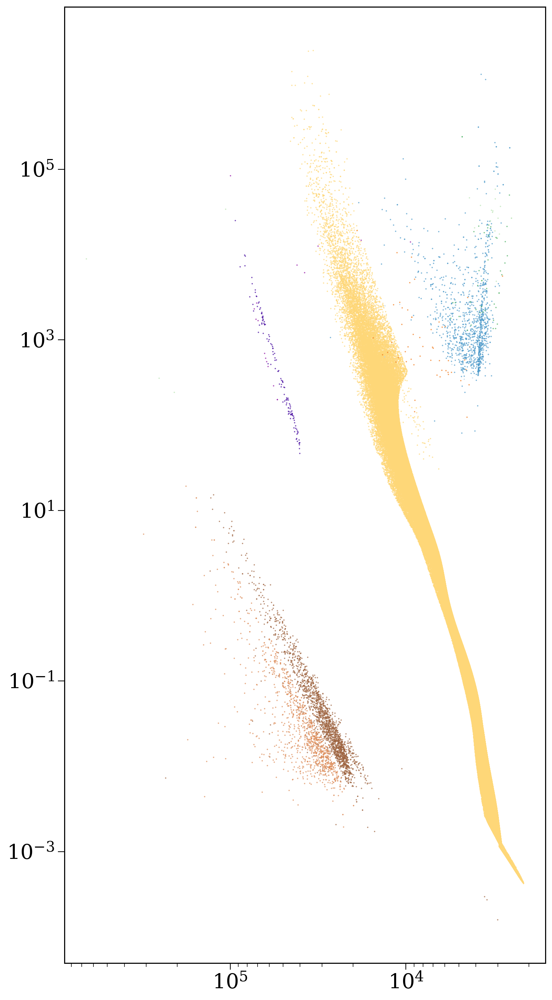

In [98]:
fig, ax = plt.subplots(figsize=(9, 18))

for stellar_type in unique_kstars:
    if stellar_type not in [13, 14, 15]:
        matching_kstar = kstar == stellar_type
        ax.scatter(teff[matching_kstar], lum[matching_kstar], s=0.1, color=stellar_types[stellar_type]["colour"])

ax.invert_xaxis()

# stellar_type_range = range(1, 14)
# for i, st in enumerate(stellar_type_range):
#     ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
#                 xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")

plt.xscale("log")
plt.yscale("log")
plt.show()

### Gaia CMD

/home/tomwagg/anaconda3/envs/cosmic-gala/lib/python3.10/site-packages/matplotlib/collections.py:981: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


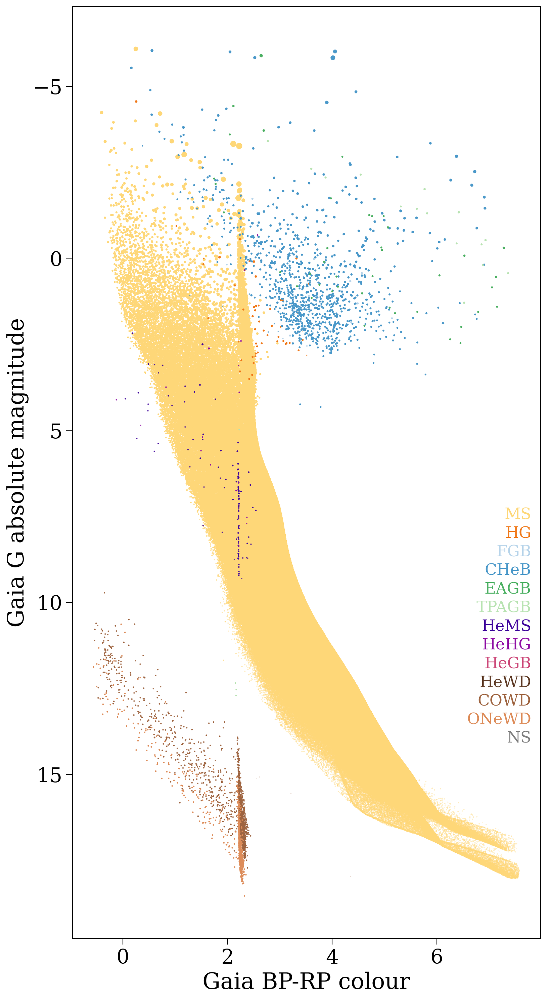

In [20]:
fig, ax = plt.subplots(figsize=(9, 18))

with np.errstate(invalid='ignore'):
    colour = G_BP_app - G_RP_app

for stellar_type in unique_kstars:
    matching_kstar = kstar == stellar_type
    ax.scatter(colour[matching_kstar], G_abs[matching_kstar], s=0.3 * mass[matching_kstar],
               color=stellar_types[stellar_type]["colour"])

ax.set_ylim(reversed(ax.get_ylim()))

ax.set_xlabel("Gaia BP-RP colour")
ax.set_ylabel("Gaia G absolute magnitude")

stellar_type_range = range(1, 14)
for i, st in enumerate(stellar_type_range):
    ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
                xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")
    
plt.show()

In [102]:
from importlib import reload
reload(kicker)

<module 'kicker' from '/home/tomwagg/Documents/cosmic-gala/kicker/__init__.py'>

In [ ]:
np.concatenate((p_bin.final_coords[0], p_bin.final_coords[1][disrupted]))

In [105]:
Av_1 = kicker.observables.get_extinction(p_bin.final_coords[0])

Loading pixel_info ...
Loading samples ...
Loading best_fit ...
Replacing NaNs in reliable distance estimates ...
Sorting pixel_info ...
Extracting hp_idx_sorted and data_idx at each nside ...
  nside = 64
  nside = 128
  nside = 256
  nside = 512
  nside = 1024
t = 17.269 s
  pix_info:   0.342 s
   samples:   6.493 s
      best:   3.303 s
       nan:   0.037 s
      sort:   6.972 s
       idx:   0.122 s


In [ ]:
Av_1 = kicker.observables.get_extinction(p_bin.final_coords[0])

Loading pixel_info ...
Loading samples ...


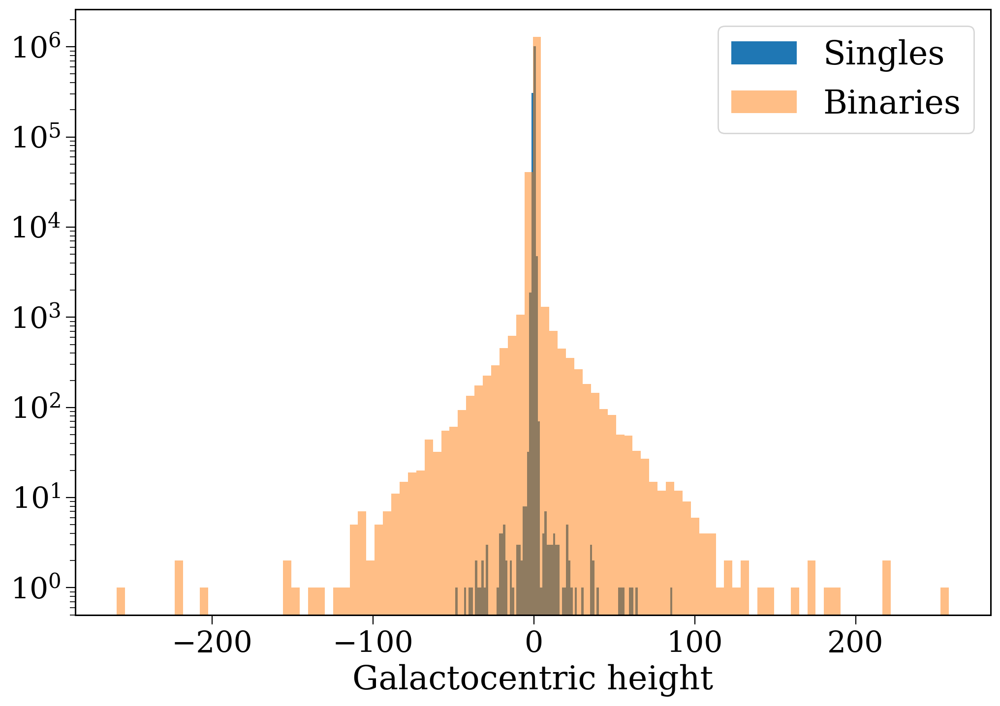

In [62]:
plt.hist(p_sing.final_coords[0].z.value, bins=100, log=True, label="Singles");
plt.hist(z.value[np.isfinite(z.value)], bins=100, alpha=0.5, log=True, label="Binaries");
plt.legend();
plt.xlabel("Galactocentric height")
plt.show()

In [99]:
import dustmaps.sfd
dustmaps.sfd.fetch()

 64.0 MiB of 64.0 MiB |   1.3 MiB/s |###################| 100% | ETA:  00:00:00

 64.0 MiB of 64.0 MiB |   1.1 MiB/s |###################| 100% | ETA:  00:00:00

### Distance vs. Apparent Magnitude

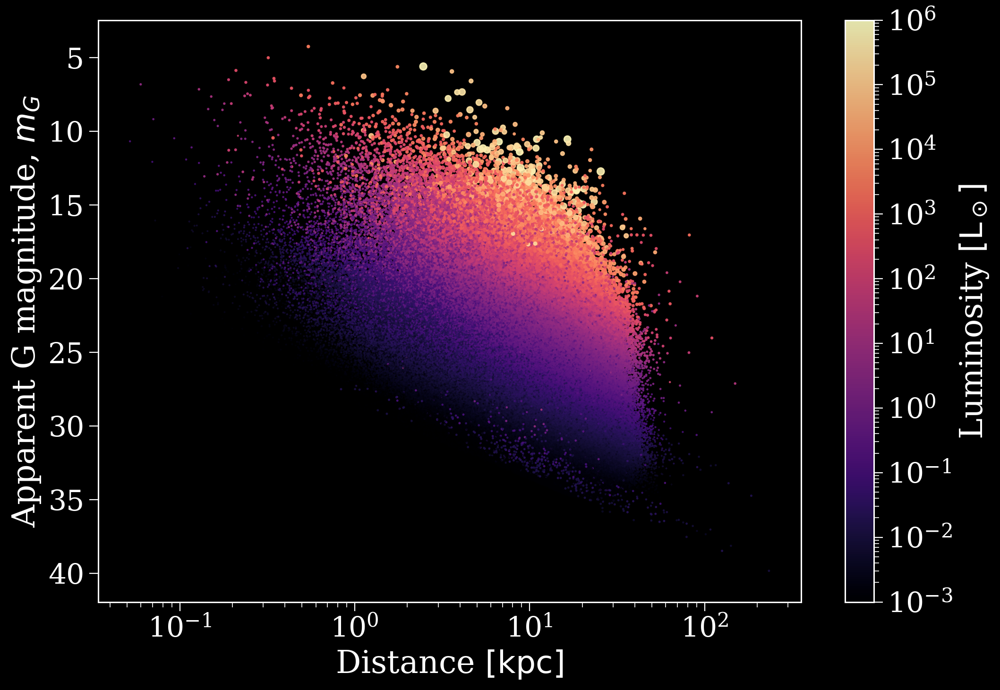

In [16]:
fig, ax = plt.subplots()

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=lum, norm=LogNorm(vmin=1e-3, vmax=1e6), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

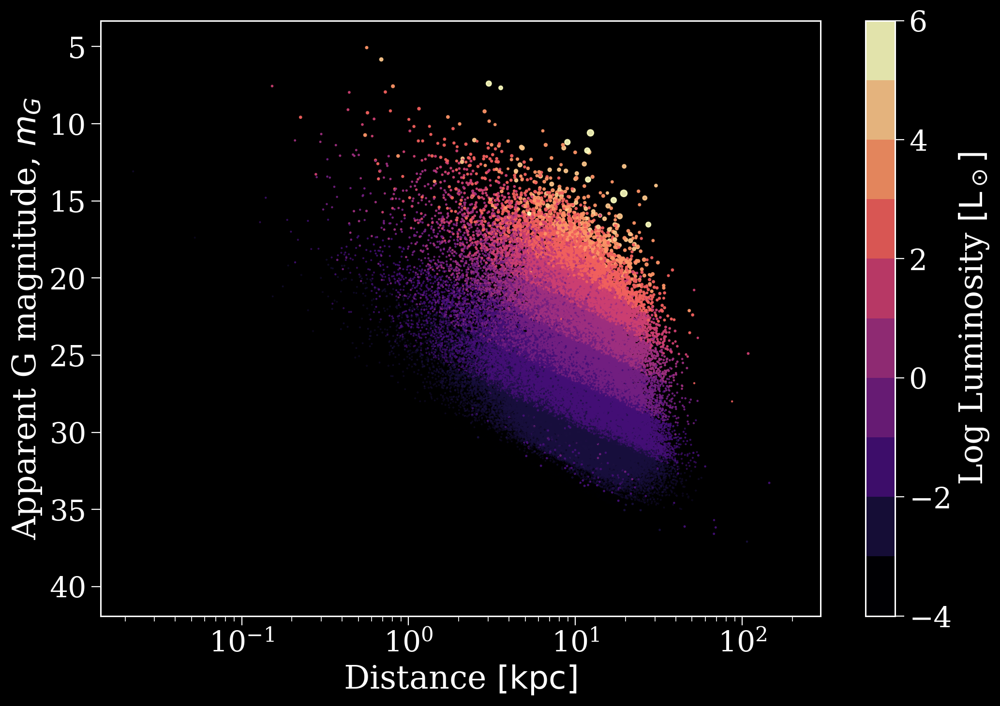

In [122]:
fig, ax = plt.subplots()

boundaries = [-4, -2, 0, 2, 4, 6]
boundaries = np.linspace(-4, 6, 11)

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=np.log10(lum), norm=BoundaryNorm(boundaries=boundaries, ncolors=256), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Log Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

## Singles

In [40]:
distances = p_sing.final_coords[0].icrs.distance
G_app = get_mag_combined(p_sing, "G", "app")
G_abs = get_mag_combined(p_sing, "G", "abs")
G_BP_app = get_mag_combined(p_sing, "BP", "app")
G_RP_app = get_mag_combined(p_sing, "RP", "app")
mass = get_binary_prop_combined(p_sing, "mass")
lum = get_binary_prop_combined(p_sing, "lum")
kstar = get_binary_prop_combined(p_sing, "kstar").astype(int)

kstar[kstar == 0] = 1
unique_kstars = np.unique(kstar)

### Gaia CMD

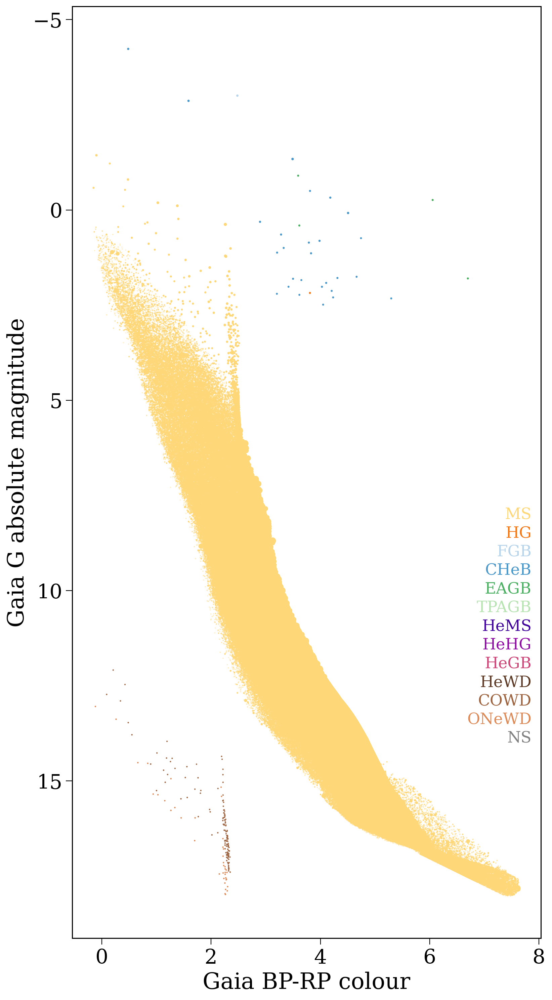

In [41]:
fig, ax = plt.subplots(figsize=(9, 18))

with np.errstate(invalid='ignore'):
    colour = G_BP_app - G_RP_app

for stellar_type in unique_kstars:
    matching_kstar = kstar == stellar_type
    ax.scatter(colour[matching_kstar], G_abs[matching_kstar], s=0.3 * mass[matching_kstar],
               color=stellar_types[stellar_type]["colour"])

ax.set_ylim(reversed(ax.get_ylim()))

ax.set_xlabel("Gaia BP-RP colour")
ax.set_ylabel("Gaia G absolute magnitude")

stellar_type_range = range(1, 14)
for i, st in enumerate(stellar_type_range):
    ax.annotate(stellar_types[st]["short"], xy=(0.98, 0.2 + 0.02 * (len(stellar_type_range) - 0.5 - i)),
                xycoords="axes fraction", color=stellar_types[st]["colour"], fontsize=0.7*fs, ha="right")
    
plt.show()

### Galactic Height

In [60]:
p_sing.final_bpp[p_sing.final_coords[0].z > 10**(0.5) * u.kpc]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,metallicity,log_g_1,log_g_2
16875,57.960203,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.895251e-11,10.0,32.403123,0.0,1.000000e+10,3.754737e+08,1.277584,0.0,0.000014,0.289525,9.972688,0.0,2.244590e-05,7.543175e-08,106657.123815,178.572684,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.188191,3.258705e+06,4.591936e-13,5.084685e+13,0.0,0.0,0.0,0.0,0.0,25.557080,0.0,0.0,0.0,16875,0.020533,14.252201,-inf
30265,126.788593,3.663639,0.0,14.0,0.0,0.0,0.0,-1.0,0.0001,2.825900e-11,10.0,121.927717,0.0,1.000000e+10,3.820850e+08,3.663639,0.0,0.000016,0.282590,8.372840,0.0,1.000000e-10,NaN,4651.899649,NaN,0.000016,0.0,1.000000e-10,0.005,1.000000e-10,0.183683,2.000000e+08,4.704629e-13,0.000000e+00,0.0,0.0,0.0,0.0,0.0,4.860877,0.0,0.0,0.0,30265,0.028709,14.619423,-inf
40841,131.577800,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.815014e-11,10.0,101.173203,0.0,1.000000e+10,3.828301e+08,1.277584,0.0,0.000014,0.281501,8.923401,0.0,2.302395e-06,NaN,60360.183401,NaN,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.182976,6.035983e+07,4.722822e-13,1.533727e+12,0.0,0.0,0.0,0.0,0.0,30.404596,0.0,0.0,0.0,40841,0.030000,14.252201,-inf
46582,88.629361,1.242000,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.891970e-11,10.0,49.168590,0.0,1.000000e+10,3.758867e+08,1.242000,0.0,0.000014,0.289197,1.434537,0.0,9.565682e-06,9.616118e-08,86175.652586,189.855284,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187978,1.966062e+07,4.597147e-13,6.818725e+12,0.0,0.0,0.0,0.0,0.0,39.460771,0.0,0.0,0.0,46582,0.020918,14.239933,-inf
69609,43.292638,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.884825e-11,10.0,24.442574,0.0,1.000000e+10,3.767418e+08,1.277584,0.0,0.000014,0.288482,11.678627,0.0,3.944727e-05,2.338824e-07,122803.242670,237.388281,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187514,9.710493e+06,4.608533e-13,1.969997e+13,0.0,0.0,0.0,0.0,0.0,18.850065,0.0,0.0,0.0,69609,0.021758,14.252201,-inf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227386,63.401111,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.974961e-11,10.0,36.543804,0.0,1.000000e+10,3.585693e+08,1.277584,0.0,0.000014,0.297496,10.069102,0.0,1.764751e-05,1.159506e-08,100432.997461,110.305524,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.193372,9.634010e+06,4.468902e-13,1.621155e+13,0.0,0.0,0.0,0.0,0.0,26.857307,0.0,0.0,0.0,1227386,0.011232,14.252201,-inf
1237670,178.370222,1.802414,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.887340e-11,10.0,166.208945,0.0,1.000000e+10,3.764473e+08,1.802414,0.0,0.000014,0.288734,15.411800,0.0,1.074345e-06,1.558628e-07,49887.477224,214.390858,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.187677,3.513158e+07,4.604517e-13,2.027338e+12,0.0,0.0,0.0,0.0,0.0,12.161278,0.0,0.0,0.0,1237670,0.021462,14.401666,-inf
1243178,110.385706,1.581026,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.911181e-11,10.0,96.462907,0.0,1.000000e+10,3.732620e+08,1.581026,0.0,0.000014,0.291118,14.347733,0.0,2.921450e-06,3.638720e-08,64062.696435,148.413072,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.189227,5.611810e+07,4.566809e-13,1.689271e+12,0.0,0.0,0.0,0.0,0.0,13.922799,0.0,0.0,0.0,1243178,0.018666,14.344751,-inf
1243702,142.466722,1.277584,0.0,13.0,0.0,0.0,0.0,-1.0,0.0001,2.839423e-11,10.0,108.326421,0.0,1.000000e+10,3.810728e+08,1.277584,0.0,0.000014,0.283942,8.516500,0.0,2.008362e-06,NaN,58333.240610,NaN,0.000014,0.0,1.000000e-10,0.005,1.000000e-10,0.184562,4.167993e+07,4.682222e-13,2.155502e+12,0.0,0.0,0.0,0.0,0.0,34.140301,0.0,0.0,0.0,1243702,0.027109,14.252201,-inf


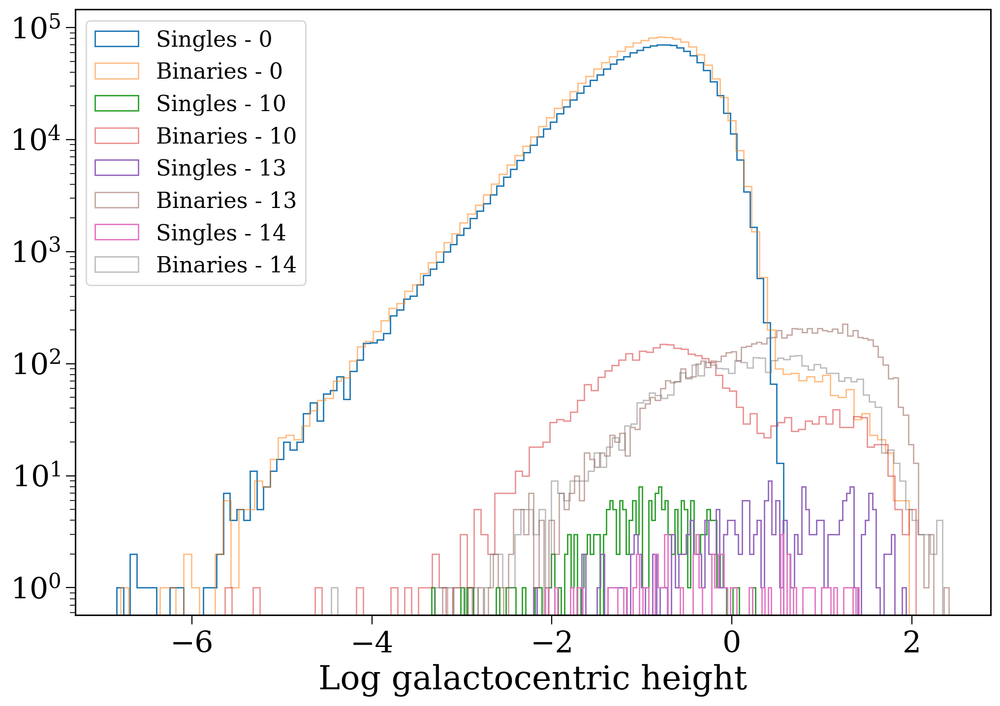

In [79]:
masks = [(0, 10), (10, 13), (13, 14), (14, 15)]

for low, high in masks:
    single_mask = (p_sing.final_bpp["kstar_1"] >= low) & (p_sing.final_bpp["kstar_1"] < high)
    binary_mask = (kstar >= low) & (kstar < high)
    plt.hist(np.log10(np.abs((p_sing.final_coords[0].z.value[single_mask]))), bins=100, log=True, label=f"Singles - {low}", histtype="step");
    plt.hist(np.log10(np.abs(z.value[np.isfinite(z.value)][binary_mask])), bins=100, alpha=0.5, log=True, label=f"Binaries - {low}", histtype="step");
plt.legend(loc="upper left", fontsize=16);
plt.xlabel("Log galactocentric height")
plt.show()

In [84]:
p_bin.mass_binaries

1812122.7956996243

In [86]:
104*1.8*200

37440.0

In [81]:
p_bin.classes.astype(int).sum()

dco                     164
co-1                   6453
co-2                   4570
xrb                     104
walkaway-t-1              0
walkaway-t-2            329
runaway-t-1               0
runaway-t-2             944
walkaway-o-1              0
walkaway-o-2              1
runaway-o-1               0
runaway-o-2            1272
widow-1                   0
widow-2                1377
stellar-merger-co-1    2096
stellar-merger-co-2    3376
pisn-1                   17
pisn-2                    5
dtype: int64

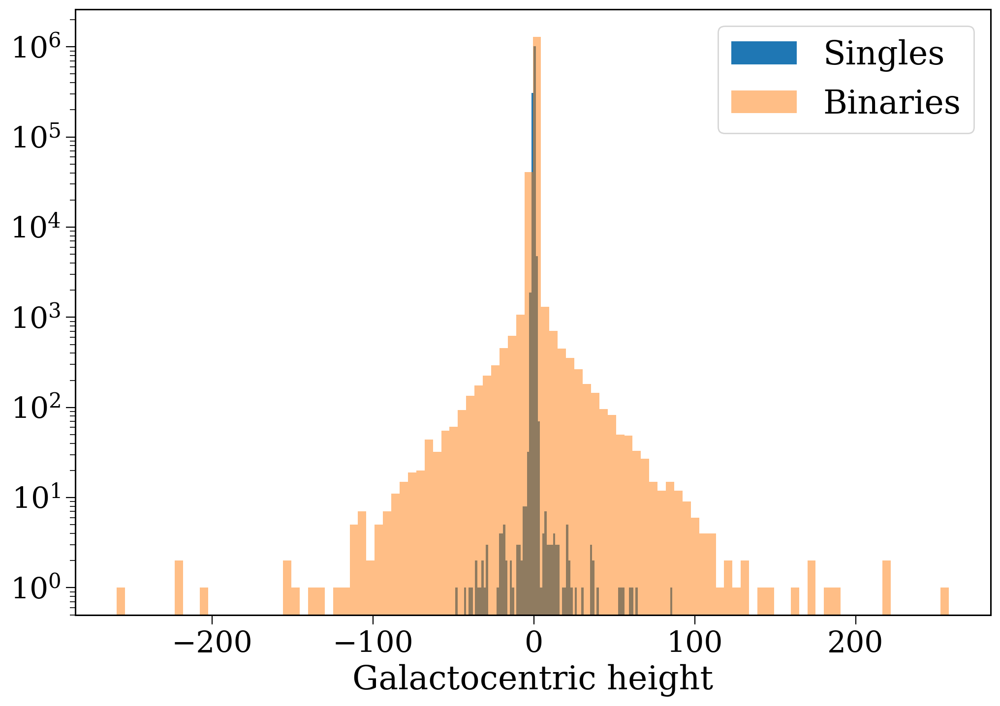

In [62]:
plt.hist(p_sing.final_coords[0].z.value, bins=100, log=True, label="Singles");
plt.hist(z.value[np.isfinite(z.value)], bins=100, alpha=0.5, log=True, label="Binaries");
plt.legend();
plt.xlabel("Galactocentric height")
plt.show()

In [56]:
p_bin.classes

,dco,co-1,co-2,xrb,walkaway-t-1,walkaway-t-2,runaway-t-1,runaway-t-2,walkaway-o-1,walkaway-o-2,runaway-o-1,runaway-o-2,widow-1,widow-2,stellar-merger-co-1,stellar-merger-co-2,pisn-1,pisn-2
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1323126,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323127,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323128,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1323129,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


### Distance vs. Apparent Magnitude

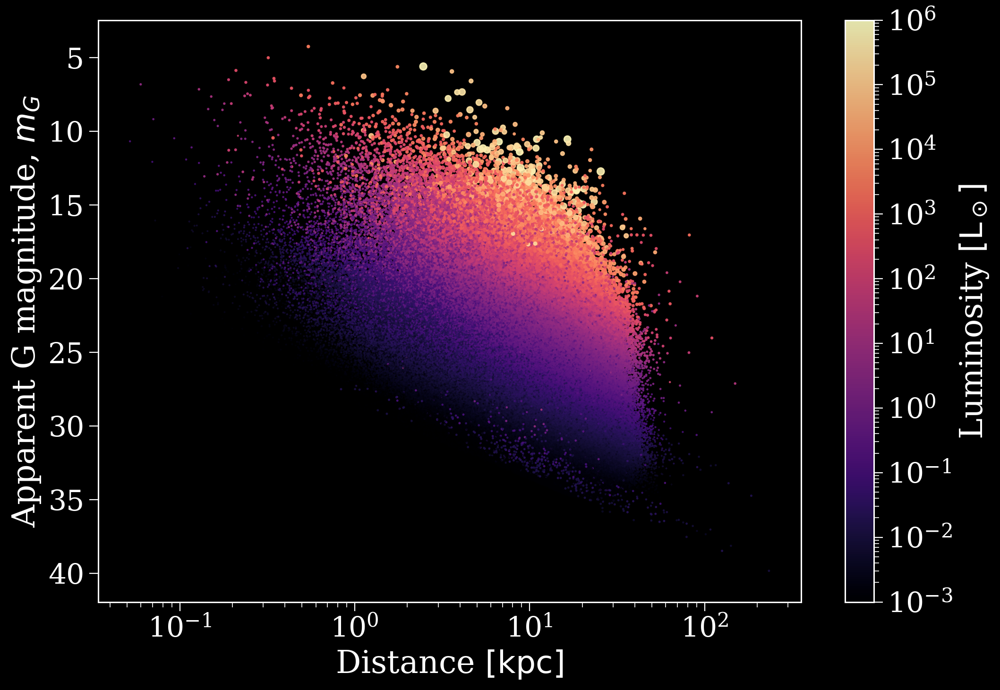

In [16]:
fig, ax = plt.subplots()

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=lum, norm=LogNorm(vmin=1e-3, vmax=1e6), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

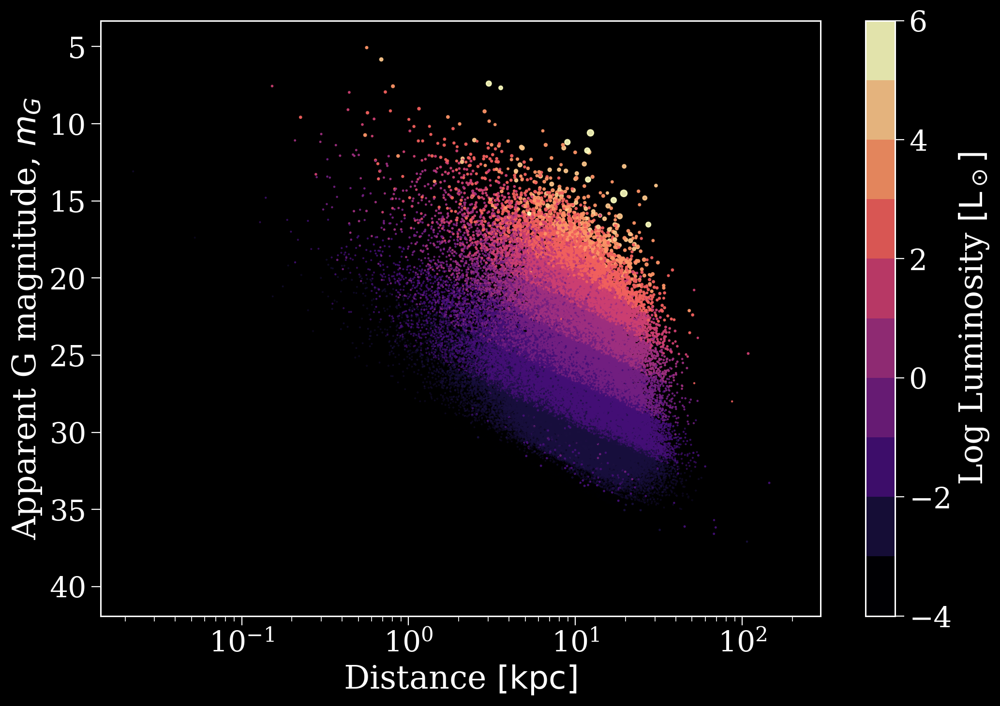

In [122]:
fig, ax = plt.subplots()

boundaries = [-4, -2, 0, 2, 4, 6]
boundaries = np.linspace(-4, 6, 11)

scatter = ax.scatter(distances, G_app, s=0.5 * mass, alpha=0.9,
                     c=np.log10(lum), norm=BoundaryNorm(boundaries=boundaries, ncolors=256), cmap="magma")

cbar = fig.colorbar(scatter, label=r"Log Luminosity $[\rm L_\odot]$")

ax.set_xlabel(r"Distance $[\rm kpc]$")
ax.set_ylabel(r"Apparent G magnitude, $m_G$")
ax.set_xscale("log")
ax.set_ylim(reversed(ax.get_ylim()))

plt.show()

# New things

## Healpy map creation

In [244]:
disrupted = (p.final_bpp["bin_num"].isin(p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique())
             & (p.final_bpp["sep"] < 0.0)
             & p.final_bpp["bin_num"].isin(p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"]))

In [269]:
def plot_map(p, coord="C", nside=128, cmap="magma", norm="log", show=True, **mollview_kwargs):
    disrupted = (p.final_bpp["bin_num"].isin(p.kick_info[p.kick_info["disrupted"] == 1.0]["bin_num"].unique())
                 & (p.final_bpp["sep"] < 0.0)
                 & p.final_bpp["bin_num"].isin(p.bpp[p.bpp["evol_type"] == 11.0]["bin_num"]))

    pix = hp.ang2pix(nside, theta=np.pi/2 - p.final_coords[0].icrs.dec.to(u.rad).value,
                     phi=p.final_coords[0].icrs.ra.to(u.rad).value, nest=True)
    disrupted_pix = hp.ang2pix(nside, theta=np.pi/2 - p.final_coords[1][disrupted].icrs.dec.to(u.rad).value,
                           phi=p.final_coords[1][disrupted].icrs.ra.to(u.rad).value, nest=True)
    
    m = np.zeros(hp.nside2npix(nside))
    inds, counts = np.unique(np.concatenate([pix, disrupted_pix]), return_counts=True)
    if norm == "log":
        counts = np.log10(counts)
    m[inds] = counts

    
    if coord.lower() not in ["c", "celestial"]:
        coord = ["C", coord]
    else:
        coord = "C"
    hp.mollview(m, nest=True, cmap=cmap, coord=coord, **mollview_kwargs)
    
    if show:
        plt.show()

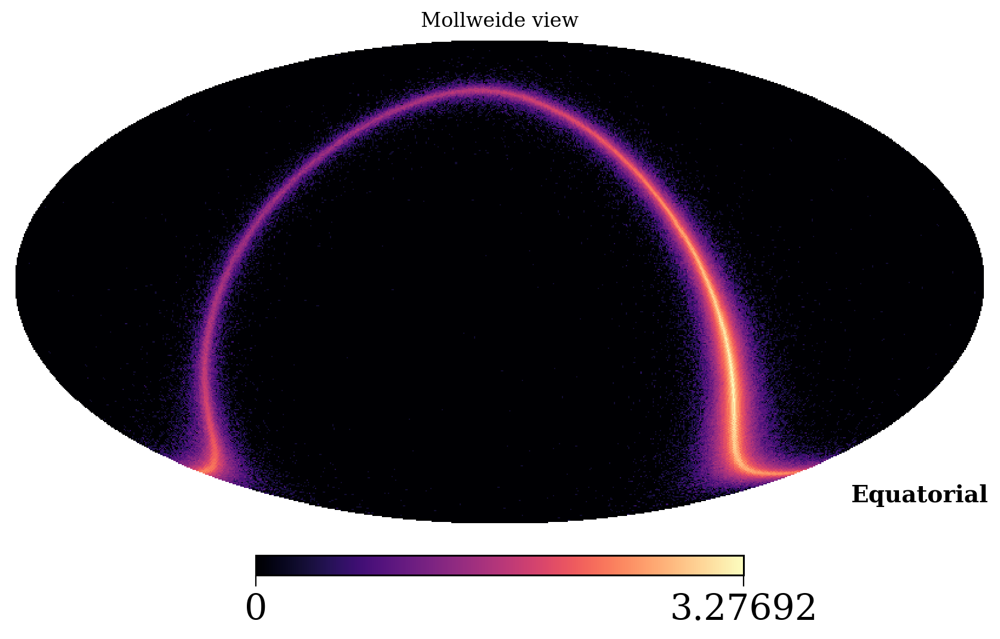

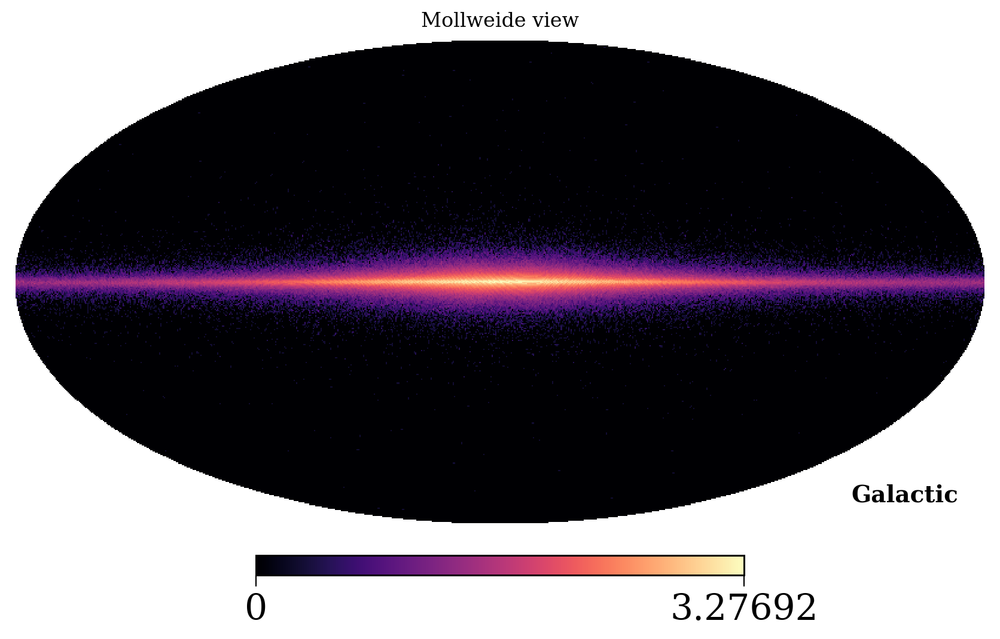

In [258]:
for coord in ["c", "g"]:
    plot_map(p, coord=coord)

## Applying Gaia selection function

In [106]:
from gaiaunlimited.selectionfunctions import DR3SelectionFunctionTCG_hpx7
from gaiaunlimited.utils import get_healpix_centers
coords_of_centers = get_healpix_centers(7)
dr3sf = DR3SelectionFunctionTCG_hpx7()

In [107]:
nside = 2**7
pix = hp.ang2pix(nside, theta=np.pi/2 - p.final_coords[0].icrs.dec.to(u.rad).value,
                 phi=p.final_coords[0].icrs.ra.to(u.rad).value, nest=True)
disrupted_pix = hp.ang2pix(nside, theta=np.pi/2 - p.final_coords[1][disrupted].icrs.dec.to(u.rad).value,
                           phi=p.final_coords[1][disrupted].icrs.ra.to(u.rad).value, nest=True)

In [108]:
def get_completeness(pix, g_mags):
    comp_coords = coords_of_centers[pix]
    g_mags = np.nan_to_num(g_mags, nan=1000)
    completeness = np.zeros(len(g_mags))
    
    bright_enough = g_mags < 22.0
    print(f'Computing the completeness for {bright_enough.astype(int).sum()} points.')
    completeness[bright_enough] = dr3sf.query(comp_coords[bright_enough], g_mags[bright_enough])
    
    return completeness

In [109]:
primary_completeness = get_completeness(pix, p.observables["G_app_1"].values)

Computing the completeness for 121151 points.


In [110]:
secondary_completeness = get_completeness(disrupted_pix, p.observables["G_app_2"].values[disrupted])

Computing the completeness for 1105 points.


In [146]:
primary_observed = p.final_bpp["bin_num"].values[np.random.uniform(size=len(primary_completeness)) < primary_completeness]
secondary_observed = p.final_bpp[disrupted]["bin_num"].values[np.random.uniform(size=len(secondary_completeness)) < secondary_completeness]

In [139]:
dists = np.sum([p_bin.final_coords[0].x.value**2, p_bin.final_coords[0].y.value**2, p_bin.final_coords[0].z.value**2], axis=0)**(0.5)

In [145]:
((dists > 75) & p_bin.classes["dco"]).sum()

30

In [125]:
p.classes.astype(int).sum()

dco                     164
co-1                   6453
co-2                   4570
xrb                     104
walkaway-t-1              0
walkaway-t-2            329
runaway-t-1               0
runaway-t-2             944
walkaway-o-1              0
walkaway-o-2              1
runaway-o-1               0
runaway-o-2            1272
widow-1                   0
widow-2                1377
stellar-merger-co-1    2096
stellar-merger-co-2    3376
pisn-1                   17
pisn-2                    5
dtype: int64

In [127]:
p.classes.loc[primary_observed].astype(int).sum()

dco                     0
co-1                   55
co-2                    0
xrb                    55
walkaway-t-1            0
walkaway-t-2            0
runaway-t-1             0
runaway-t-2             0
walkaway-o-1            0
walkaway-o-2            0
runaway-o-1             0
runaway-o-2             0
widow-1                 0
widow-2                55
stellar-merger-co-1     0
stellar-merger-co-2     0
pisn-1                  0
pisn-2                  0
dtype: int64

In [338]:
p.classes.loc[secondary_observed].astype(int).sum()

dco                      0
co-1                   945
co-2                     0
xrb                      0
walkaway-t-1             0
walkaway-t-2           299
runaway-t-1              0
runaway-t-2            646
walkaway-o-1             0
walkaway-o-2             0
runaway-o-1              0
runaway-o-2            945
widow-1                  0
widow-2                945
stellar-merger-co-1      0
stellar-merger-co-2      0
pisn-1                   0
pisn-2                   0
dtype: int64

In [151]:
reload(kicker)

<module 'kicker' from '/home/tomwagg/Documents/cosmic-gala/kicker/__init__.py'>

In [160]:
p_sing._classes = determine_final_classes(population=p_sing)

In [162]:
p_sing.classes.sum()

dco                      0
co-1                     0
co-2                     0
xrb                      0
walkaway-t-1             0
walkaway-t-2             0
runaway-t-1              0
runaway-t-2              0
walkaway-o-1             0
walkaway-o-2             0
runaway-o-1              0
runaway-o-2              0
widow-1                  0
widow-2                  0
stellar-merger-co-1    282
stellar-merger-co-2      0
pisn-1                   0
pisn-2                   0
dtype: int64

## Mask only OBA stars

In [59]:
def get_hot_luminous_mask(photometry, ind=1):
    bright = photometry[f"G_app_{ind}"] < 16
    at_least_b7v = photometry[f"K_abs_{ind}"] < 0

    g_minus_k = photometry[f"G_app_{ind}"] - photometry[f"K_app_{ind}"]
    j_ks_0 = (photometry[f"J_app_{ind}"] - photometry[f"K_app_{ind}"]) - 0.25 * g_minus_k
    oba = (j_ks_0 > -0.3) & (j_ks_0 < 0.1)

    j_minus_h = photometry[f"J_app_{ind}"] - photometry[f"H_app_{ind}"]
    remove_turn_off = (j_minus_h < 0.15 * g_minus_k + 0.05) & (j_minus_h > 0.15 * g_minus_k - 0.15)
    remove_giants = photometry[f"G_app_{ind}"] > 2 * g_minus_k + 3
    
    return bright & at_least_b7v & oba & remove_turn_off & remove_giants

In [60]:
hot_luminous = get_hot_luminous_mask(p.observables)

In [63]:
hot_luminous_secondary = get_hot_luminous_mask(p.observables, ind=2)

# Old grid plots

In [25]:
def grid_plot(x_var, y_var, x_label, y_label):
    fig, axes = plt.subplots(2, 2, figsize=(20, 20), gridspec_kw={"width_ratios": [3, 1], "height_ratios": [1, 3]})

    fig.subplots_adjust(hspace=0.0, wspace=0.0)

    disrupted = final_binaries["sep"] < 0
    kicked = final_binaries.index.isin(kicked_nums)

    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][~kicked]), np.abs(final_binaries[f"{y_var}_1"][~kicked]), s=5, label=f"No supernova ({len(final_binaries[~kicked])})")

    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][kicked]), np.abs(final_binaries[f"{y_var}_1"][kicked]), s=10, color="C1", label=f"At least 1 supernova ({len(final_binaries[kicked])})")
    axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_2"][kicked & disrupted]), np.abs(final_binaries[f"{y_var}_2"][kicked & disrupted]), s=5, color="C1")

    axes[1, 0].set_xscale("log")
    axes[1, 0].set_yscale("log")

    axes[1, 0].set_xlabel(x_label)
    axes[1, 0].set_ylabel(y_label)

    axes[1, 0].legend(fontsize=0.7*fs, markerscale=5, handletextpad=0.0)

    axes[0, 1].axis("off")

    x_bins = np.logspace(np.log10(np.abs(final_binaries[f"{x_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{x_var}_1"]).max()), 50)
    axes[0, 0].hist(np.abs(final_binaries[f"{x_var}_1"][~kicked]), bins=x_bins, log=True)
    axes[0, 0].hist(np.abs(np.concatenate((final_binaries[f"{x_var}_1"][kicked], final_binaries[f"{x_var}_2"][kicked]))), bins=x_bins, log=True, alpha=0.5)
    axes[0, 0].set_xscale("log")
    axes[0, 0].set_xticks([])
    axes[0, 0].set_ylabel(r"$N_{\rm binary}$")

    y_bins = np.logspace(np.log10(np.abs(final_binaries[f"{y_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{y_var}_1"]).max()), 50)
    axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][~kicked]), bins=y_bins, orientation="horizontal", log=True)
    axes[1, 1].hist(np.abs(np.concatenate((final_binaries[f"{y_var}_1"][kicked], final_binaries[f"{y_var}_2"][kicked]))), bins=y_bins, orientation="horizontal", log=True, alpha=0.5)
    axes[1, 1].set_yscale("log")
    axes[1, 1].set_yticks([])
    axes[1, 1].set_xlabel(r"$N_{\rm binary}$")

    plt.show()

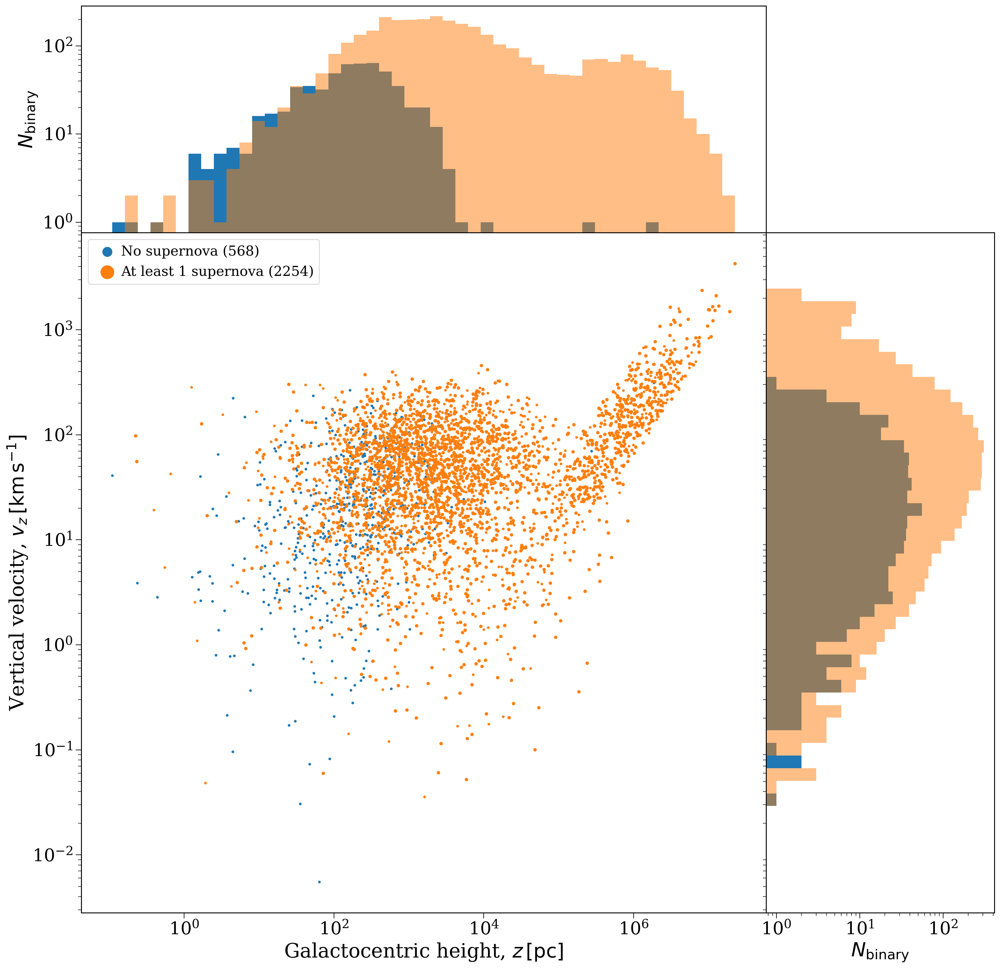

In [17]:
grid_plot("z", "v_z", r"Galactocentric height, $z\,[\rm pc]$", r"Vertical velocity, $v_z\,[\rm km \, s^{-1}]$")

In [18]:
for ind in [1, 2]:
    final_binaries[f"dist_{ind}"] = np.sqrt(final_binaries[f"x_{ind}"]**2 + final_binaries[f"y_{ind}"]**2 + final_binaries[f"z_{ind}"]**2)
    final_binaries[f"speed_{ind}"] = np.sqrt(final_binaries[f"v_x_{ind}"]**2 + final_binaries[f"v_y_{ind}"]**2 + final_binaries[f"v_z_{ind}"]**2)

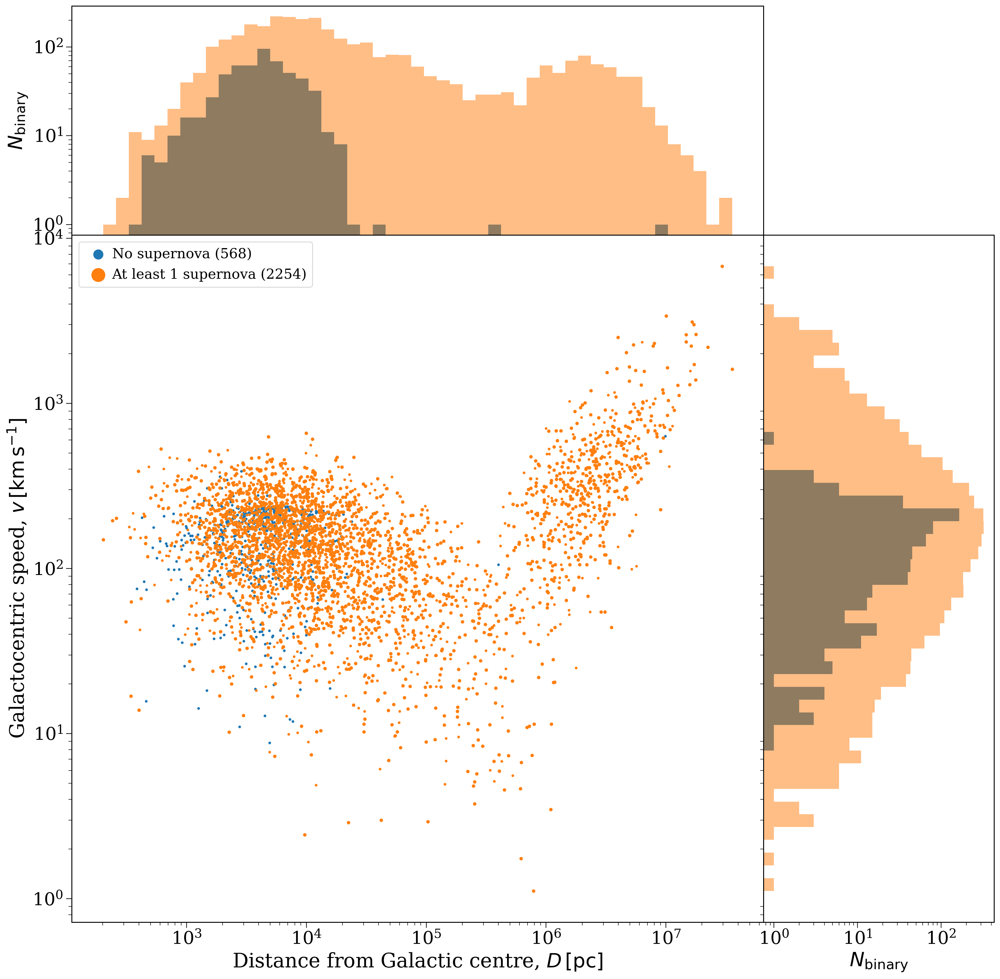

In [23]:
grid_plot("dist", "speed", r"Distance from Galactic centre, $D\,[\rm pc]$", r"Galactocentric speed, $v\,[\rm km \, s^{-1}]$")

In [20]:
def grid_plot_by_mass(x_var, y_var, x_label, y_label, mass_lims=[0.0, 0.1, 1.5, 7.0, 20, np.inf], sizes=[1, 1, 10, 10, 10]):
    fig, axes = plt.subplots(2, 2, figsize=(20, 20), gridspec_kw={"width_ratios": [3, 1], "height_ratios": [1, 3]})

    fig.subplots_adjust(hspace=0.0, wspace=0.0)

    disrupted = final_binaries["sep"] < 0

    x_bins = np.logspace(np.log10(np.abs(final_binaries[f"{x_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{x_var}_1"]).max()), 50)
    y_bins = np.logspace(np.log10(np.abs(final_binaries[f"{y_var}_1"]).min()), np.log10(np.abs(final_binaries[f"{y_var}_1"]).max()), 50)
    for i in range(len(mass_lims) - 1):
        mass_mask = ((p.initial_binaries["mass_1"] >= mass_lims[i]) & (p.initial_binaries["mass_1"] < mass_lims[i + 1])).values
        label = f"{mass_lims[i]} " + r"$\leq m_{1, i} <$" + f" {mass_lims[i + 1]}   ({len(final_binaries[mass_mask])})"
        axes[1, 0].scatter(np.abs(final_binaries[f"{x_var}_1"][mass_mask]), np.abs(final_binaries[f"{y_var}_1"][mass_mask]), s=sizes[i], label=label)
        axes[0, 0].hist(np.abs(final_binaries[f"{x_var}_1"][mass_mask]), bins=x_bins, log=True, histtype="step")
        axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][mass_mask]), bins=y_bins, orientation="horizontal", log=True, histtype="step")

    axes[1, 0].set_xscale("log")
    axes[1, 0].set_yscale("log")

    axes[1, 0].set_xlabel(x_label)
    axes[1, 0].set_ylabel(y_label)

    axes[1, 0].legend(fontsize=0.7*fs, markerscale=5, handletextpad=0.0)

    axes[0, 1].axis("off")
    
    axes[0, 0].set_xscale("log")
    axes[0, 0].set_xticks([])
    axes[0, 0].set_ylabel(r"$N_{\rm binary}$")

    # axes[1, 1].hist(np.abs(final_binaries[f"{y_var}_1"][~kicked]), bins=y_bins, orientation="horizontal", log=True)
    # axes[1, 1].hist(np.abs(np.concatenate((final_binaries[f"{y_var}_1"][kicked], final_binaries[f"{y_var}_2"][kicked]))), bins=y_bins, orientation="horizontal", log=True, alpha=0.5)
    axes[1, 1].set_yscale("log")
    axes[1, 1].set_yticks([])
    axes[1, 1].set_xlabel(r"$N_{\rm binary}$")

    plt.show()

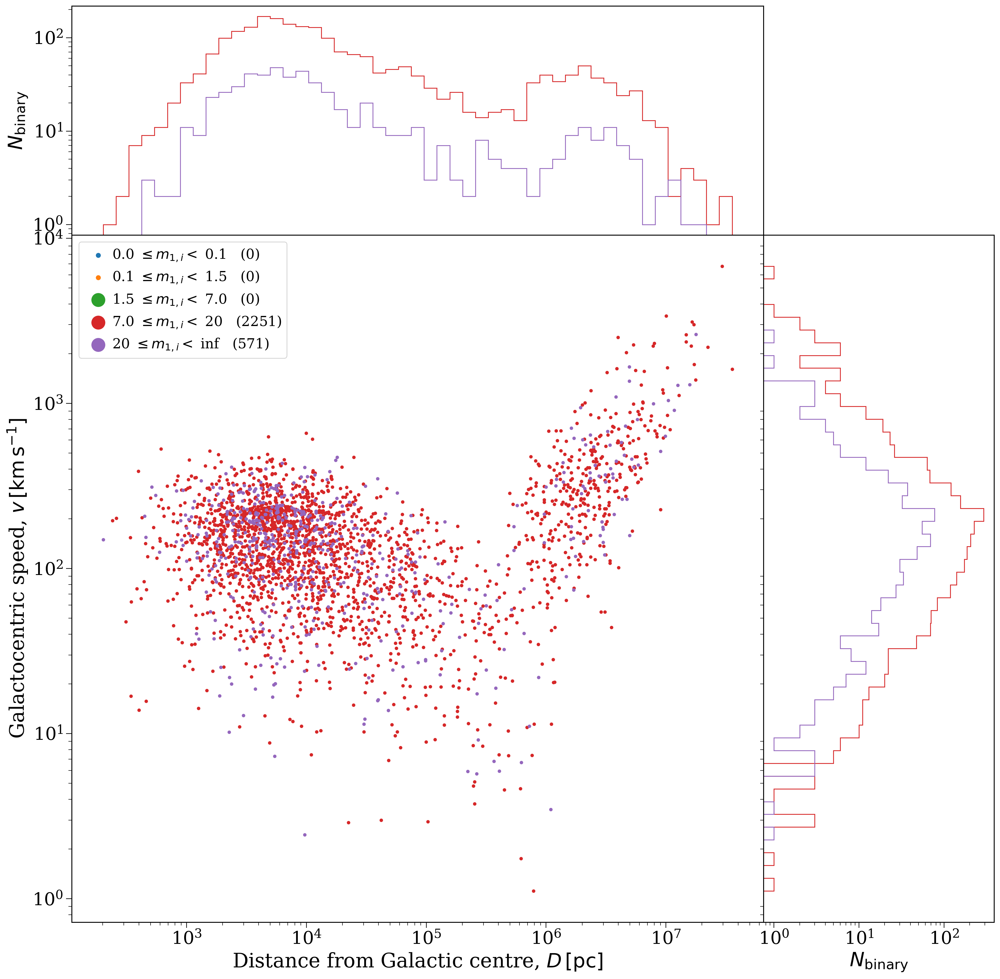

In [22]:
grid_plot_by_mass("dist", "speed", r"Distance from Galactic centre, $D\,[\rm pc]$", r"Galactocentric speed, $v\,[\rm km \, s^{-1}]$")

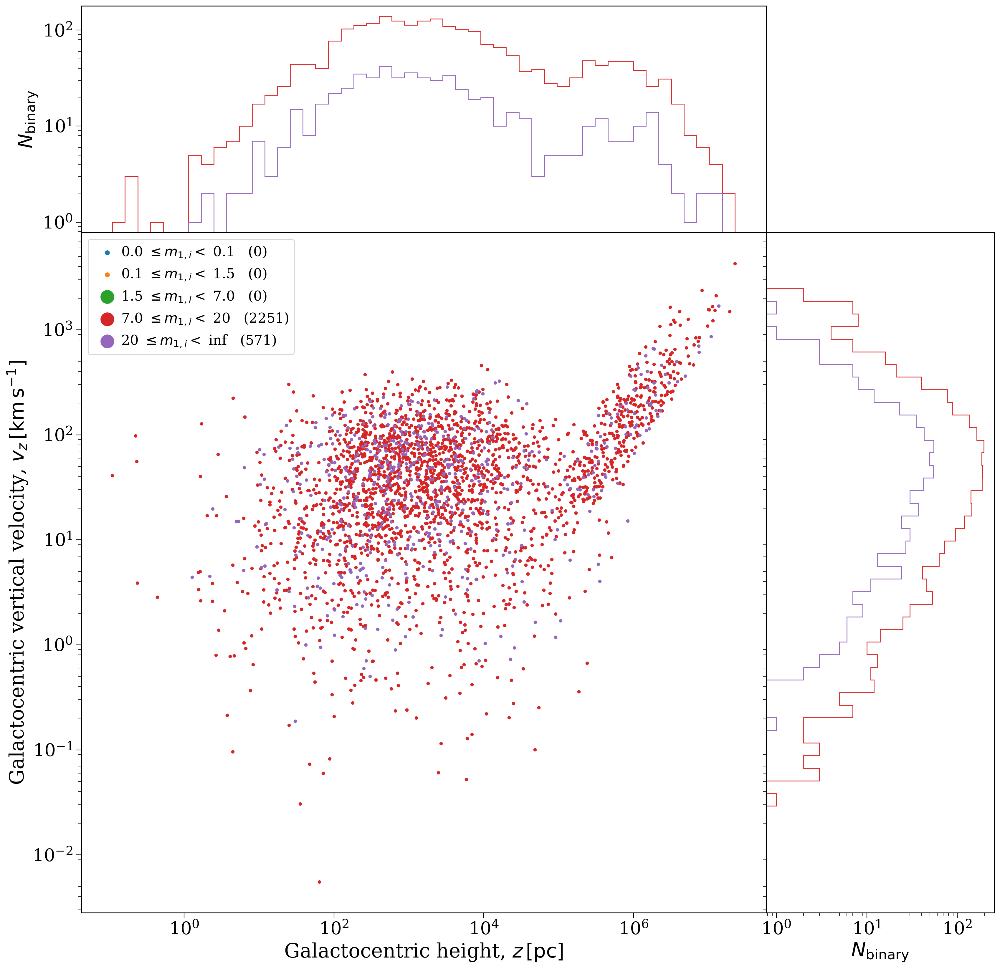

In [24]:
grid_plot_by_mass("z", "v_z", r"Galactocentric height, $z\,[\rm pc]$", r"Galactocentric vertical velocity, $v_z\,[\rm km \, s^{-1}]$")